In [ ]:
!pip install geopandas
!pip install contextily

     |████████████████████████████████| 1.0 MB 32.0 MB/s 
     |████████████████████████████████| 15.4 MB 44.6 MB/s 
     |████████████████████████████████| 6.3 MB 11.8 MB/s 
     |████████████████████████████████| 19.3 MB 1.2 MB/s 


In [ ]:
import geopandas as gpd
import pandas as pd 
import matplotlib.pyplot as plt
import contextily

1. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero

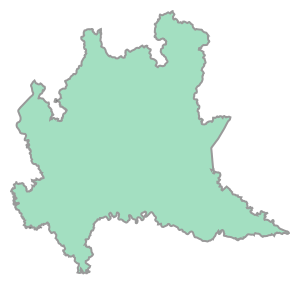

In [ ]:
ita = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/Reg01012021_g")
lombardia = ita[ita["DEN_REG"] == "Lombardia"].geometry.squeeze()
lombardia

In [ ]:
comuni = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/Com01012021_g")
comuni

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,1001,001001,AgliÃ¨,None,0,16097.848297,1.330696e+07,"POLYGON ((404703.558 5026682.655, 405359.554 5..."
1,1,1,1,201,201,1002,001002,Airasca,None,0,16684.218599,1.595353e+07,"POLYGON ((380700.909 4977305.520, 381105.998 4..."
2,1,1,1,201,201,1003,001003,Ala di Stura,None,0,29892.674582,4.575189e+07,"POLYGON ((364710.857 5022090.678, 364737.794 5..."
3,1,1,1,201,201,1004,001004,Albiano d'Ivrea,None,0,16192.656480,1.103356e+07,"POLYGON ((415942.504 5033304.609, 416079.315 5..."
4,1,1,1,201,201,1006,001006,Almese,None,0,16077.245089,1.771710e+07,"POLYGON ((376934.962 4999073.854, 376960.555 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,5,20,111,0,111,111103,111103,Villaputzu,None,0,100515.537851,1.807260e+08,"MULTIPOLYGON (((556602.772 4375162.650, 556598..."
7899,5,20,111,0,111,111104,111104,Villasalto,None,0,58635.095264,1.303933e+08,"POLYGON ((541186.146 4375105.653, 541180.146 4..."
7900,5,20,111,0,111,111105,111105,Villasimius,None,0,49735.818257,5.759282e+07,"MULTIPOLYGON (((546451.098 4325900.553, 546443..."
7901,5,20,111,0,111,111106,111106,Villasor,None,0,53375.684321,8.640693e+07,"POLYGON ((500362.475 4361229.767, 500397.474 4..."


In [ ]:
comuni_lomb = comuni[comuni.within(lombardia)]

comuni_lomb["area_bella"] = comuni_lomb.area / 10**6 
comuni_lomb

comuni_infer = comuni_lomb[comuni_lomb["area_bella"] < 10]
comuni_infer


/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,area_bella
1448,1,3,12,0,12,12001,012001,Agra,None,0,6996.108320,2.942389e+06,"POLYGON ((482802.662 5097733.142, 482784.662 5...",2.942389
1449,1,3,12,0,12,12002,012002,Albizzate,None,0,9255.748026,3.813831e+06,"POLYGON ((485235.221 5064709.066, 485545.361 5...",3.813831
1453,1,3,12,0,12,12006,012006,Azzate,None,0,11761.330818,4.536471e+06,"POLYGON ((483900.127 5071449.880, 484020.211 5...",4.536471
1454,1,3,12,0,12,12007,012007,Azzio,None,0,7602.953671,2.172798e+06,"POLYGON ((477914.331 5082436.678, 477696.259 5...",2.172798
1455,1,3,12,0,12,12008,012008,Barasso,None,0,10877.705348,3.872669e+06,"POLYGON ((481124.582 5079579.276, 481862.732 5...",3.872669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7738,1,3,108,0,108,108048,108048,Verano Brianza,None,0,9171.724083,3.667862e+06,"POLYGON ((517613.394 5060787.396, 518293.122 5...",3.667862
7739,1,3,108,0,108,108049,108049,Villasanta,None,0,9629.121636,4.645122e+06,"POLYGON ((523356.646 5052024.704, 523490.961 5...",4.645122
7741,1,3,108,0,108,108051,108051,Busnago,None,0,11376.029586,5.834750e+06,"POLYGON ((535742.586 5052473.474, 535839.585 5...",5.834750
7742,1,3,108,0,108,108052,108052,Caponago,None,0,11874.711735,4.807794e+06,"POLYGON ((530927.622 5047008.514, 530890.358 5...",4.807794


I comuni con una superficie minore di 10 kmq sono; 
 1448              Agra
1449         Albizzate
1453            Azzate
1454             Azzio
1455           Barasso
             ...      
7738    Verano Brianza
7739        Villasanta
7741           Busnago
7742          Caponago
7745          Roncello
Name: COMUNE, Length: 709, dtype: object


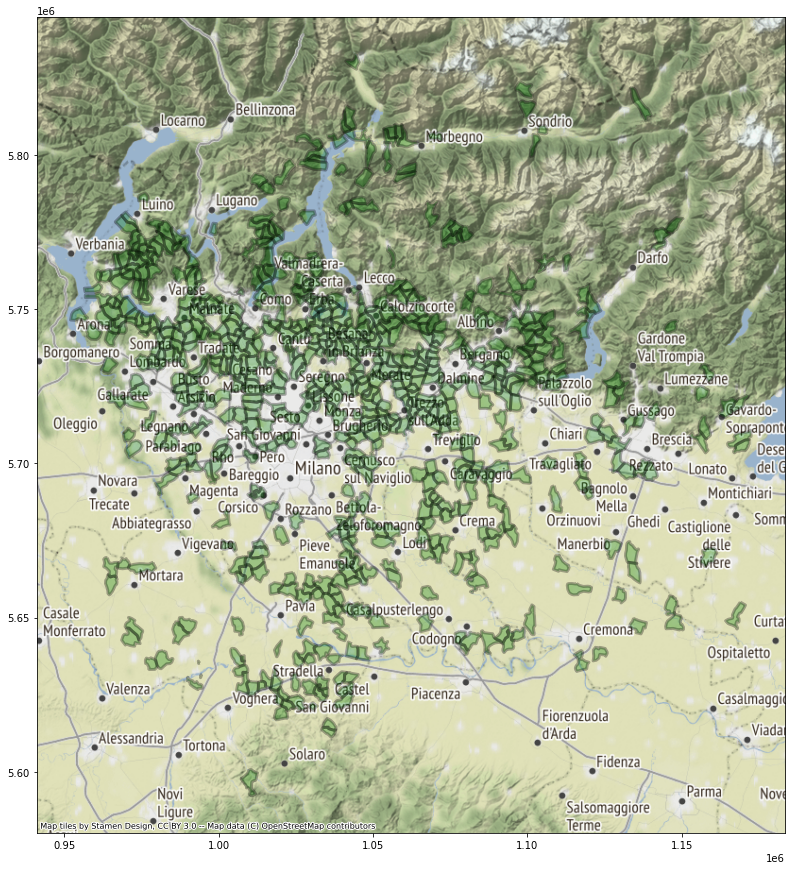

In [ ]:
print("I comuni con una superficie minore di 10 kmq sono; \n",comuni_infer.COMUNE )

ax = comuni_infer.to_crs(epsg=3857).plot(figsize= (15, 15),facecolor = "g", alpha = 0.3, edgecolor="k", linewidth=3)
contextily.add_basemap(ax=ax)

2. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq e che si trovano all'interno di un parco: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero. Visualizzare anche i parchi

In [ ]:
parchi = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/Parchi_regionali_e_nazionali_polygon.zip")
parchi

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


In [ ]:
comuni_in_parchi = comuni_infer[comuni_infer.within(parchi.unary_union)]
comuni_in_parchi

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,area_bella
1468,1,3,12,0,12,12021,012021,Brinzio,None,0,11411.097228,6.331554e+06,"POLYGON ((485212.146 5082260.257, 485813.047 5...",6.331554
1478,1,3,12,0,12,12032,012032,Cardano al Campo,None,0,13167.344776,9.719170e+06,"POLYGON ((482139.874 5056008.899, 482510.114 5...",9.719170
1485,1,3,12,0,12,12039,012039,Casorate Sempione,None,0,10833.342473,6.904374e+06,"POLYGON ((479910.698 5058376.220, 480839.388 5...",6.904374
1514,1,3,12,0,12,12068,012068,Ferno,None,0,14509.069937,8.881223e+06,"POLYGON ((478697.847 5053371.432, 478784.656 5...",8.881223
1624,1,3,13,0,13,13059,013059,Castelnuovo Bozzente,None,0,8014.926758,3.769634e+06,"POLYGON ((496062.659 5068749.356, 496323.628 5...",3.769634
1841,1,3,15,215,215,15061,015061,Cassinetta di Lugagnano,None,0,8392.126482,3.624219e+06,"POLYGON ((493127.901 5031226.632, 493816.897 5...",3.624219
7478,1,3,98,0,98,98033,098033,Maccastorna,None,0,10177.115803,5.360894e+06,"POLYGON ((567384.343 5000275.858, 567572.342 5...",5.360894


I comuni all'interno dei parchi sono: 
 1468                    Brinzio
1478           Cardano al Campo
1485          Casorate Sempione
1514                      Ferno
1624       Castelnuovo Bozzente
1841    Cassinetta di Lugagnano
7478                Maccastorna
Name: COMUNE, dtype: object


/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:82: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  if is_color_like(value):


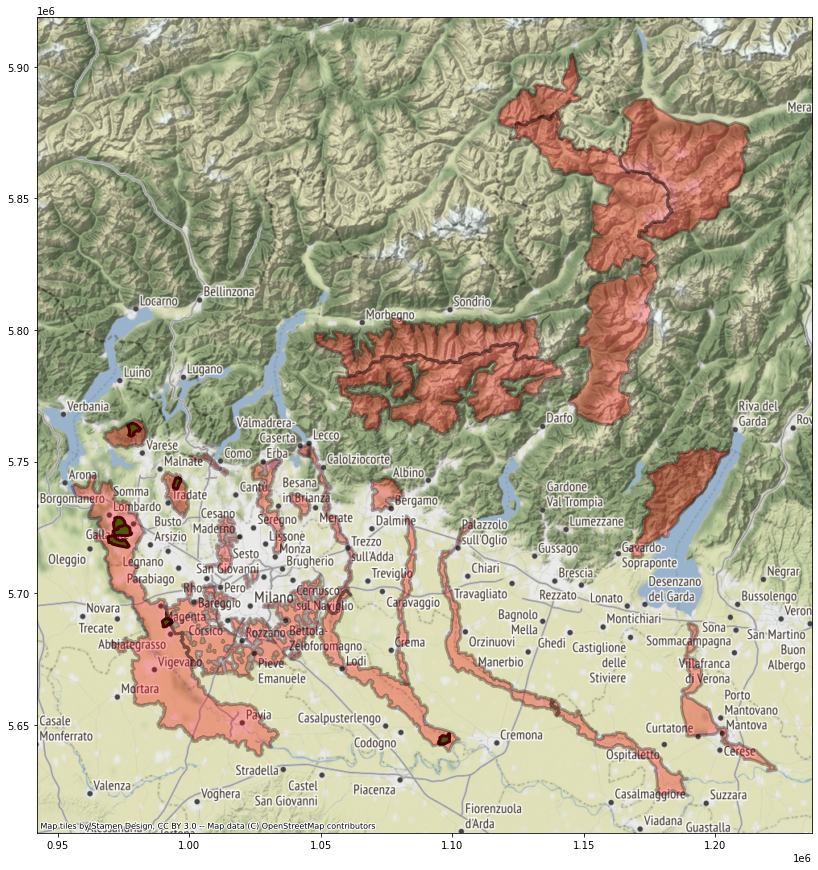

In [ ]:
print("I comuni all'interno dei parchi sono: \n" , comuni_in_parchi.COMUNE)

ax = comuni_in_parchi.to_crs(epsg=3857).plot(figsize= (15, 15),facecolor = "G", edgecolor="k", linewidth=3)
parchi.to_crs(epsg=3857).plot(ax = ax,facecolor = "r", alpha = 0.3, edgecolor="k", linewidth=3)
contextily.add_basemap(ax=ax)

3. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq, che si trovano all'interno di un parco e sono attraversati da un corso d'acqua: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero. Visualizzare anche i corsi d'acqua

In [ ]:
corsi_acqua = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/Corsi_acqua_Piano_di_Gestione.zip")
corsi_acqua

,OBJECTID,COD_PTUA16,NATURA,REGIONE,NOME,SOTTOBACIN,TIPOLOGIA,A_PROTETTA,SENSIBILE,VULNERABIL,D_HABITAT,D_UCCELLI,RAMSAR,BALNEAZION,VITA_PESCI,USO_POTAB,AREE_A_PR,BACINO,RAGG_ECO,RAGG_CHI,STATO_ECO,CONF_ECO,STATO_CHI,CONF_CHI,ANNI_CHI,ANNI_ECO,OBB_CHI,OBB_ECO,ESENZIONI,SHAPE_LEN,geometry
0,188,IT03POTI3GRCA1LO,artificiale,Lombardia,Naviglio Grande (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,sufficiente,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,44301.215986,"LINESTRING (480362.262 5040575.220, 480364.627..."
1,191,IT03POTI3SNCA1LO,artificiale,Lombardia,Scolmatore Piene Nord - Ovest (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,34035.857991,"MULTILINESTRING ((494060.091 5029696.046, 4940..."
2,215,IT03N0080447LO,naturale,Lombardia,Lambro (Fiume),Lambro (Asta),06SS4N,sì,sì,sì,no,sì,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,21811.145089,"MULTILINESTRING ((536963.747 5005395.412, 5369..."
3,252,IT03N008044003021LO,naturale,Lombardia,Garbogera (Torrente),Lambro (Asta),06IN7N,sì,no,sì,sì,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,sì,sì,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,19767.119220,"LINESTRING (509280.513 5047845.024, 509281.795..."
4,255,IT03N0080440441LO,naturale,Lombardia,Sillaro Salerano,Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,13180.757122,"LINESTRING (528977.056 5024109.798, 528981.181..."
5,256,IT03N0080440701LO,naturale,Lombardia,Addetta (Colatore),Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,9403.459186,"MULTILINESTRING ((530299.337 5029522.740, 5302..."
6,282,IT03POLSRECA1LO,artificiale,Lombardia,Redefossi (Cavo),nd,06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18403.681560,"LINESTRING (514894.561 5036362.164, 514898.993..."
7,65,ITIRN0080984IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,no,sì,TICINO,no,no,sufficiente,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,38206.257375,"MULTILINESTRING ((483579.882 5034726.498, 4835..."
8,66,ITIRN0080982IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,sì,sì,TICINO,no,no,buono,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,mantenimento dello stato buono,Nessuna proroga o deroga,35927.352062,"MULTILINESTRING ((477067.969 5044605.066, 4770..."
9,67,ITIRN0080983IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,no,sì,TICINO,no,no,buono,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,mantenimento dello stato buono,Nessuna proroga o deroga,17917.785813,"MULTILINESTRING ((477477.600 5043097.081, 4774..."


In [ ]:
comuni_attraversati = comuni_in_parchi[comuni_in_parchi.intersects(corsi_acqua.unary_union)]
comuni_attraversati

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,area_bella
1841,1,3,15,215,215,15061,015061,Cassinetta di Lugagnano,None,0,8392.126482,3.624219e+06,"POLYGON ((493127.901 5031226.632, 493816.897 5...",3.624219


I comuni attraversati da un corso d'acqua sono: 
 1841    Cassinetta di Lugagnano
Name: COMUNE, dtype: object


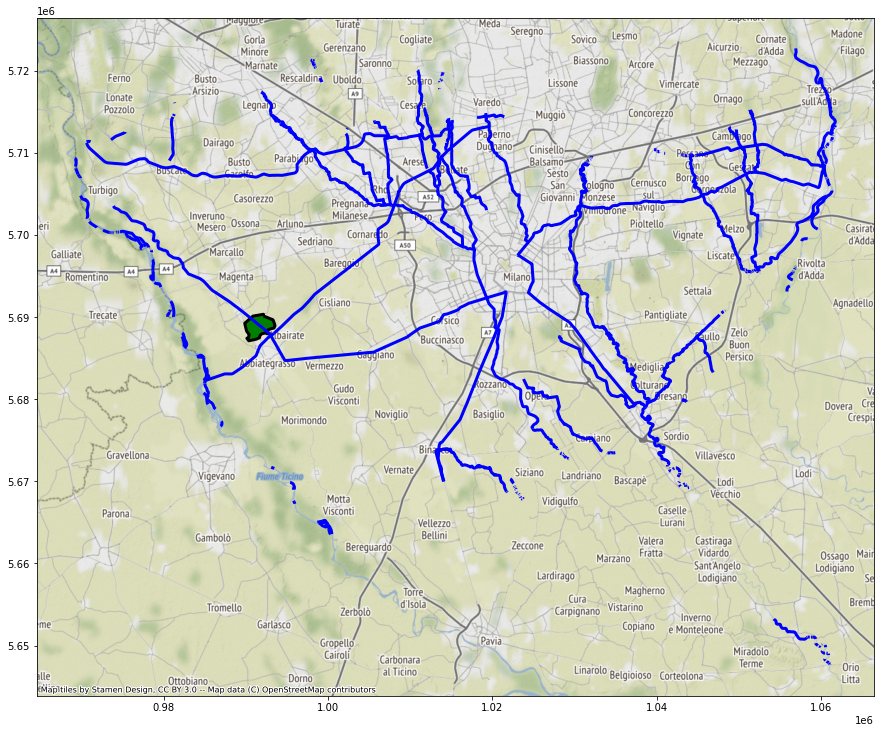

In [ ]:
print("I comuni attraversati da un corso d'acqua sono: \n", comuni_attraversati.COMUNE)

ax = comuni_attraversati.to_crs(epsg=3857).plot(figsize= (15, 15),facecolor = "G", edgecolor="k", linewidth=3)
corsi_acqua.to_crs(epsg=3857).plot(ax = ax, edgecolor="b", linewidth=3)
contextily.add_basemap(ax=ax)

4. l'elenco dei comuni che si trovano a più di 1 km da un'autostrada: visualizzare il numero, l'elenco e una mappa con in rosso i comuni che si trovano a meno di 1 km e in verde gli altri (vedi immagine allegata)

In [ ]:
autostrade= gpd.read_file("/content/drive/MyDrive/marieriale geopandas/Autostrade_10000_CT10_line.zip")
autostrade

,TS_EID,COD_PE,PERCORSO,geometry
0,19.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (496352.634 4981573.415, 496378.384..."
1,18.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (580517.421 4994637.417, 580735.915..."
2,21.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (580524.796 4994628.417, 580745.039..."
3,65.0,A50,TANGENZIALE OVEST DI MILANO,"LINESTRING (521699.514 5024872.823, 521630.139..."
4,62.0,A50,TANGENZIALE OVEST DI MILANO,"LINESTRING (504384.530 5044095.266, 504414.405..."
5,90.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (519364.775 5030574.241, 519401.151..."
6,78.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (519346.650 5030596.741, 519377.151..."
7,7.0,A1,AUTOSTRADA MILANO - ROMA,"LINESTRING (519364.775 5030574.241, 519352.525..."
8,8.0,A1,AUTOSTRADA MILANO - ROMA,"LINESTRING (519346.650 5030596.741, 519337.900..."
9,1922.0,A8,AUTOSTRADA MILANO- VARESE,"LINESTRING (485557.854 5069342.204, 485588.231..."


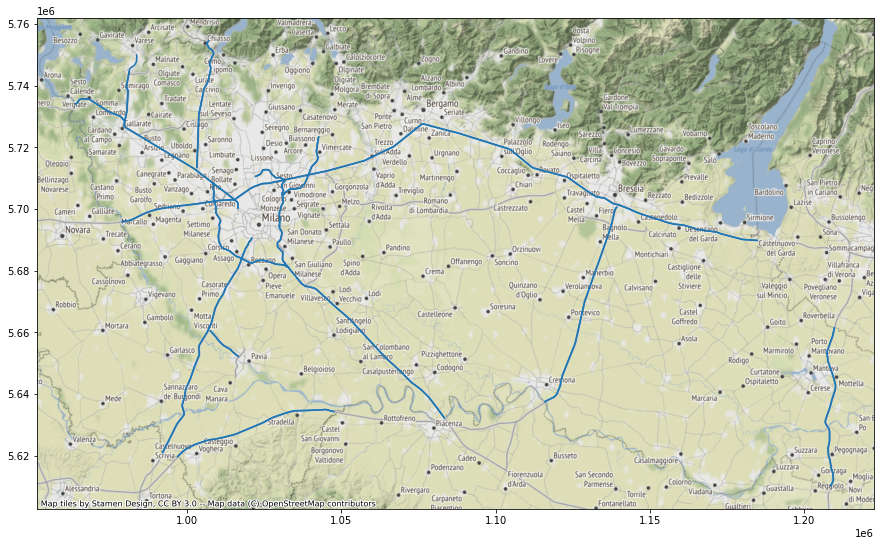

In [ ]:
from shapely.geometry import LineString

ax = autostrade.to_crs(epsg = 3857).plot(figsize= (15,15))
contextily.add_basemap(ax = ax)

In [ ]:
comuni_piu1km = comuni_lomb[comuni_lomb.distance(autostrade.unary_union)>1000]
comuni_piu1km

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,area_bella
1448,1,3,12,0,12,12001,012001,Agra,None,0,6996.108320,2.942389e+06,"POLYGON ((482802.662 5097733.142, 482784.662 5...",2.942389
1450,1,3,12,0,12,12003,012003,Angera,None,0,24194.847570,1.748219e+07,"POLYGON ((470218.756 5071198.335, 470937.656 5...",17.482186
1451,1,3,12,0,12,12004,012004,Arcisate,None,0,19072.979574,1.229388e+07,"POLYGON ((488207.686 5080963.765, 488368.654 5...",12.293875
1454,1,3,12,0,12,12007,012007,Azzio,None,0,7602.953671,2.172798e+06,"POLYGON ((477914.331 5082436.678, 477696.259 5...",2.172798
1455,1,3,12,0,12,12008,012008,Barasso,None,0,10877.705348,3.872669e+06,"POLYGON ((481124.582 5079579.276, 481862.732 5...",3.872669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7737,1,3,108,0,108,108047,108047,Veduggio con Colzano,None,0,7986.758681,3.390555e+06,"POLYGON ((519686.705 5065270.380, 519754.706 5...",3.390555
7738,1,3,108,0,108,108048,108048,Verano Brianza,None,0,9171.724083,3.667862e+06,"POLYGON ((517613.394 5060787.396, 518293.122 5...",3.667862
7739,1,3,108,0,108,108049,108049,Villasanta,None,0,9629.121636,4.645122e+06,"POLYGON ((523356.646 5052024.704, 523490.961 5...",4.645122
7743,1,3,108,0,108,108053,108053,Cornate d'Adda,None,0,15414.910444,1.364665e+07,"POLYGON ((537678.573 5057235.438, 537951.570 5...",13.646650


In [ ]:
comuni_meno1km = comuni_lomb[comuni_lomb.distance(autostrade.unary_union)<1000]

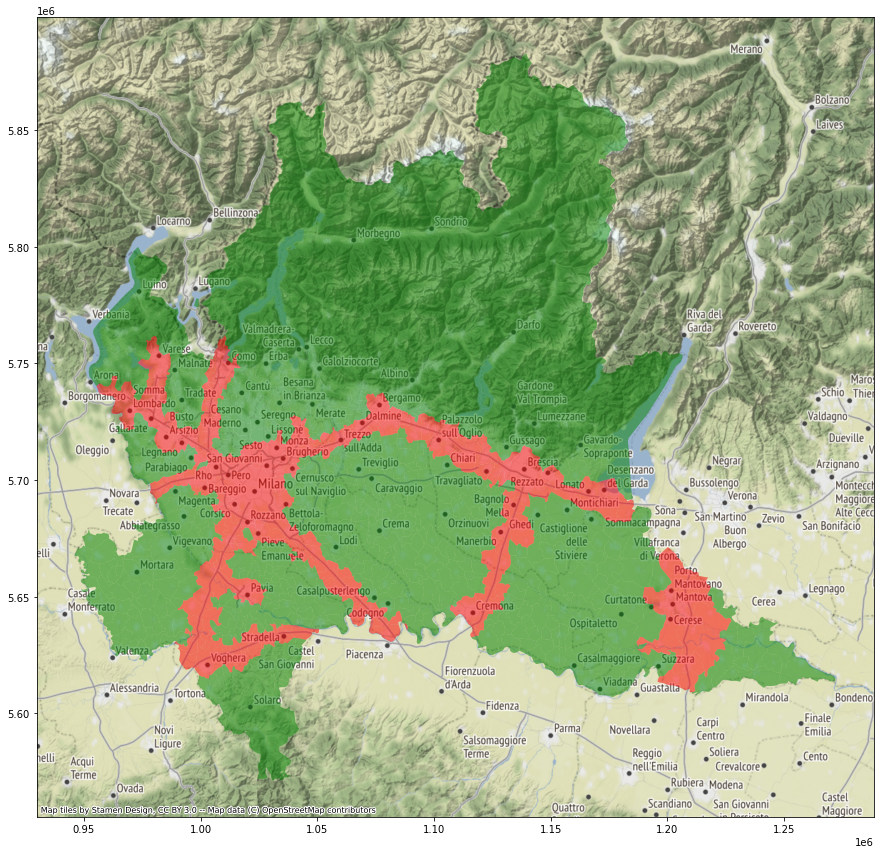

In [ ]:
ax = comuni_piu1km.to_crs(epsg=3857).plot(figsize=(15, 15), facecolor='green', alpha=0.5)
comuni_meno1km.to_crs(epsg=3857).plot(ax=ax, facecolor='red', alpha  = 0.5 )
contextily.add_basemap(ax=ax )

5. l'elenco dei quartieri di Milano attraversati da una autostrada: visualizzare una mappa con i quartieri. Aggiungere anche il nome del quartiere sulla mappa.

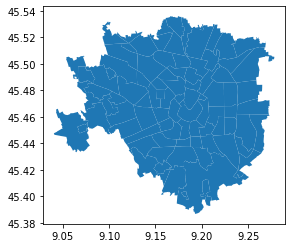

In [ ]:
quartieri = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/ds964_nil_wm.zip")
quartieri.plot()

In [ ]:
quartieri.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
quartieri_attraversati = quartieri[quartieri.intersects(autostrade.to_crs(epsg=4326).unary_union)]
quartieri_attraversati

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((9.08375 45.48485, 9.08280 45.48521, ..."
7,76,QUARTO OGGIARO - VIALBA - MUSOCCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7138.355680,2.776872e+06,96,"POLYGON ((9.13481 45.52095, 9.13481 45.52094, ..."
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((9.08375 45.48485, 9.08444 45.48459, ..."
16,43,TIBALDI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3964.077498,7.861846e+05,105,"POLYGON ((9.18775 45.43732, 9.18644 45.43733, ..."
22,75,STEPHENSON,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3582.570059,5.600844e+05,111,"POLYGON ((9.13009 45.50820, 9.13016 45.50784, ..."
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((9.16112 45.42589, 9.16270 45.42544, ..."
26,46,BARONA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6836.011433,2.006249e+06,115,"POLYGON ((9.16112 45.42589, 9.16056 45.42605, ..."
27,71,VILLAPIZZONE - CAGNOLA - BOLDINASCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8375.003494,3.426941e+06,116,"POLYGON ((9.16204 45.49690, 9.16012 45.49570, ..."
28,88,PARCO BOSCO IN CITTA',05/02/2020,Vigente,Milano 2030 - PGT Approvato,37072.981211,7.834006e+06,117,"POLYGON ((9.07309 45.50604, 9.07326 45.50589, ..."
31,32,TRIULZO SUPERIORE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6923.734083,1.389578e+06,120,"POLYGON ((9.26378 45.43251, 9.26384 45.43248, ..."


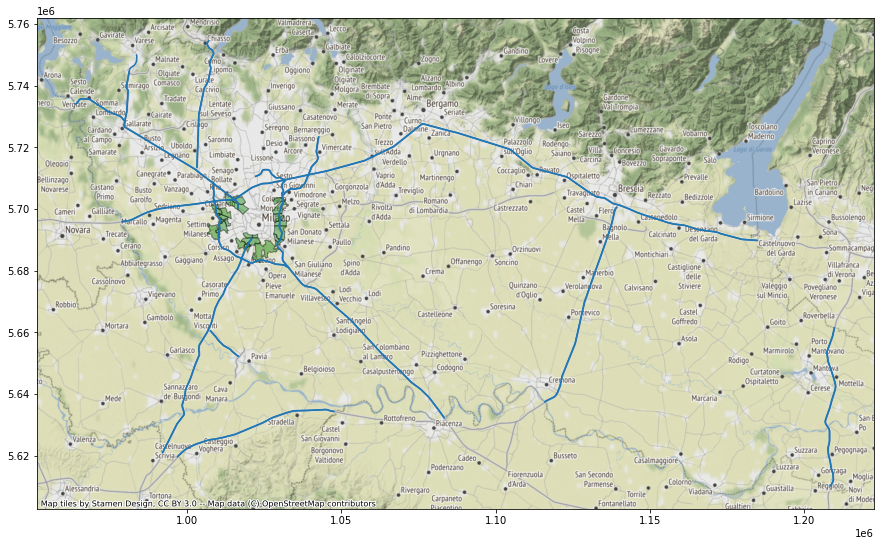

In [ ]:
ax = quartieri_attraversati.to_crs(epsg=3857).plot(figsize=(15,15), facecolor= "g", alpha= 0.4, edgecolor= "k")
autostrade.to_crs(epsg=3857).plot(ax=ax)
contextily.add_basemap(ax=ax)

In [ ]:
quartieri_attra_copy = quartieri_attraversati.copy()
quartieri_attra_copy.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
quartieri_attra_copy.to_crs(epsg=3857, inplace=True)
quartieri_attra_copy.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
quartieri_attra_copy["coordinate"] = quartieri_attra_copy["geometry"].apply(lambda x: x.representative_point().coords[:])
quartieri_attra_copy

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry,coordinate
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((1011198.900 5698176.961, 1011092.872...","[(1010190.3166120737, 5699170.107388781)]"
7,76,QUARTO OGGIARO - VIALBA - MUSOCCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7138.355680,2.776872e+06,96,"POLYGON ((1016882.080 5703910.058, 1016882.269...","[(1017094.5514039886, 5702812.006293386)]"
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((1011198.900 5698176.961, 1011275.272...","[(1011931.3653679857, 5697205.933701251)]"
16,43,TIBALDI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3964.077498,7.861846e+05,105,"POLYGON ((1022775.669 5690633.479, 1022629.490...","[(1021932.3896148928, 5691265.104399953)]"
22,75,STEPHENSON,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3582.570059,5.600844e+05,111,"POLYGON ((1016356.796 5701884.818, 1016364.997...","[(1015519.3120330912, 5702392.288544547)]"
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((1019811.544 5688820.411, 1019987.008...","[(1019507.060942286, 5688255.308215838)]"
26,46,BARONA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6836.011433,2.006249e+06,115,"POLYGON ((1019811.544 5688820.411, 1019748.373...","[(1018972.580493863, 5689586.905076373)]"
27,71,VILLAPIZZONE - CAGNOLA - BOLDINASCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8375.003494,3.426941e+06,116,"POLYGON ((1019913.357 5700090.572, 1019700.177...","[(1018097.9778729774, 5700154.179582881)]"
28,88,PARCO BOSCO IN CITTA',05/02/2020,Vigente,Milano 2030 - PGT Approvato,37072.981211,7.834006e+06,117,"POLYGON ((1010011.828 5701541.489, 1010030.324...","[(1012906.0649844063, 5697951.58522605)]"
31,32,TRIULZO SUPERIORE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6923.734083,1.389578e+06,120,"POLYGON ((1031239.542 5689869.559, 1031245.576...","[(1029450.2595839831, 5689065.327990683)]"


In [ ]:
quartieri_attra_copy["coordinate"] = [coords[0] for coords in quartieri_attra_copy["coordinate"]]
quartieri_attra_copy

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry,coordinate
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((1011198.900 5698176.961, 1011092.872...","(1010190.3166120737, 5699170.107388781)"
7,76,QUARTO OGGIARO - VIALBA - MUSOCCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7138.355680,2.776872e+06,96,"POLYGON ((1016882.080 5703910.058, 1016882.269...","(1017094.5514039886, 5702812.006293386)"
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((1011198.900 5698176.961, 1011275.272...","(1011931.3653679857, 5697205.933701251)"
16,43,TIBALDI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3964.077498,7.861846e+05,105,"POLYGON ((1022775.669 5690633.479, 1022629.490...","(1021932.3896148928, 5691265.104399953)"
22,75,STEPHENSON,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3582.570059,5.600844e+05,111,"POLYGON ((1016356.796 5701884.818, 1016364.997...","(1015519.3120330912, 5702392.288544547)"
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((1019811.544 5688820.411, 1019987.008...","(1019507.060942286, 5688255.308215838)"
26,46,BARONA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6836.011433,2.006249e+06,115,"POLYGON ((1019811.544 5688820.411, 1019748.373...","(1018972.580493863, 5689586.905076373)"
27,71,VILLAPIZZONE - CAGNOLA - BOLDINASCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8375.003494,3.426941e+06,116,"POLYGON ((1019913.357 5700090.572, 1019700.177...","(1018097.9778729774, 5700154.179582881)"
28,88,PARCO BOSCO IN CITTA',05/02/2020,Vigente,Milano 2030 - PGT Approvato,37072.981211,7.834006e+06,117,"POLYGON ((1010011.828 5701541.489, 1010030.324...","(1012906.0649844063, 5697951.58522605)"
31,32,TRIULZO SUPERIORE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6923.734083,1.389578e+06,120,"POLYGON ((1031239.542 5689869.559, 1031245.576...","(1029450.2595839831, 5689065.327990683)"


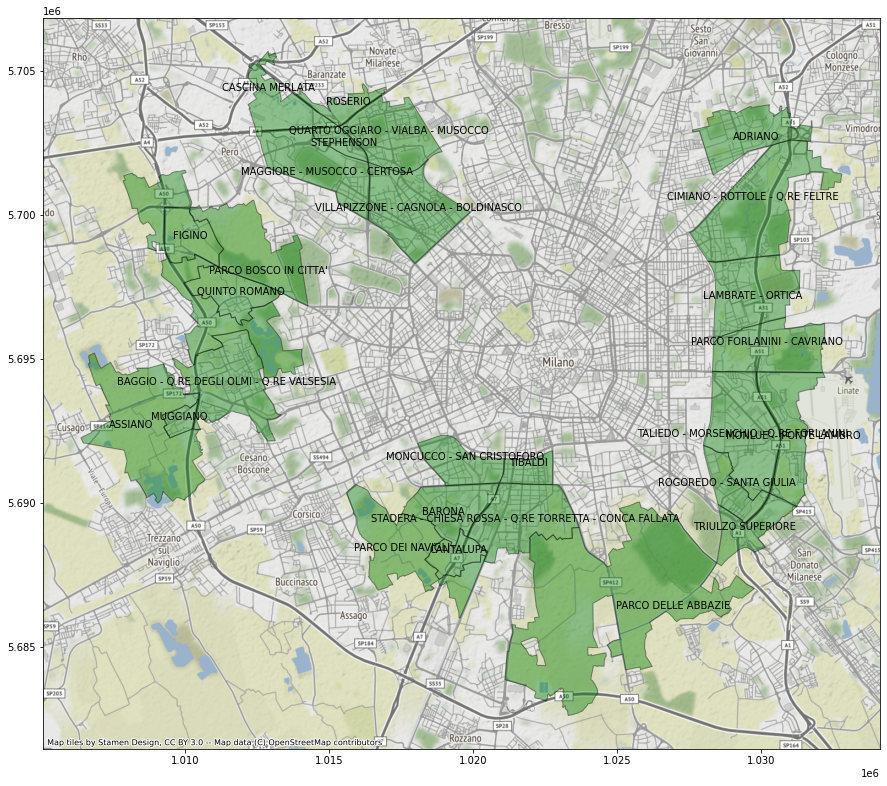

In [ ]:
ax = quartieri_attraversati.to_crs(epsg=3857).plot(figsize=(15,15), facecolor= "g", alpha= 0.4, edgecolor= "k")
contextily.add_basemap(ax=ax)

for idx, row in quartieri_attra_copy.iterrows():
   plt.annotate(s=row["NIL"], xy=row["coordinate"], horizontalalignment="center", color="k")